In [1]:
import pandas as pd
import numpy as np
import chart_studio.plotly as py
import cufflinks as cf
import seaborn as sns
import plotly.express as px
%matplotlib inline

from plotly.offline import download_plotlyjs, init_notebook_mode
init_notebook_mode(connected=True)
cf.go_offline()

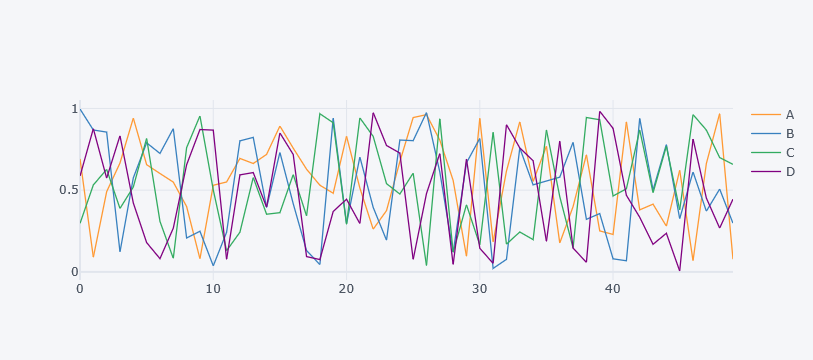

In [2]:
arr1 = np.random.rand(50, 4)
df1 = pd.DataFrame(arr1, columns=["A", "B", "C", "D"])
df1.head()
df1.iplot()

# Line Plots

In [3]:
import plotly.graph_objects as go

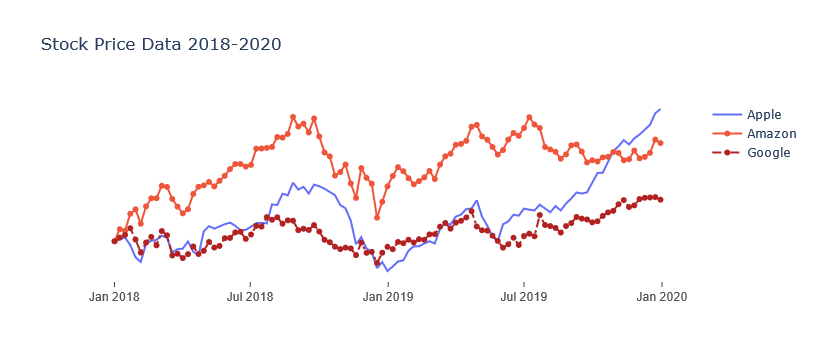

In [4]:
df_stocks = px.data.stocks()
px.line(df_stocks, x="date", y="GOOG", labels={"x": "Date", "y": "GOOG"})
px.line(df_stocks, x="date", y=["GOOG", "AAPL"], labels={"x": "Date", "y": "Price"}, title="Apple vs Google")


fig = go.Figure()
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AAPL, mode="lines", name="Apple"))
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AMZN, mode="lines+markers", name="Amazon"))
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.GOOG, mode="lines+markers", name="Google", 
                         line=dict(color="firebrick", width=2, dash="dashdot")))

fig.update_layout(
    title="Stock Price Data 2018-2020", 
    xaxis=dict(
        showline=True, 
        showgrid=True, 
        showticklabels=True, 
        linewidth=2, 
        ticks="outside", 
        tickfont=dict(
            family="Arial", 
            size=12, 
            color="rgb(82, 82, 82)")
    ), 
    yaxis=dict(
        showgrid=False, 
        zeroline=True, 
        showline=True,
        showticklabels=False,
    ),
    margin=dict(
        autoexpand=True,
    ),
    showlegend=True,
    plot_bgcolor="white"
)

# Bar Charts

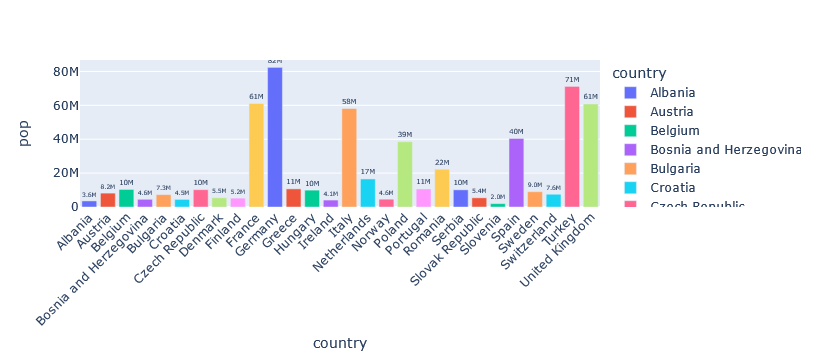

In [16]:
df_us = px.data.gapminder().query("country == 'United States'")
px.bar(df_us, x="year", y="pop")

df_tips = px.data.tips()
px.bar(df_tips, x="day", y="tip", color="sex", title="Tips by Sex on Each Day", 
       labels={"tip": "Tip Amount", "day": "Day of the Week"})

px.bar(df_tips, x="sex", y="total_bill", color="smoker", barmode="group")

df_europe = px.data.gapminder().query("continent == 'Europe' and year == 2007 and pop > 2e6")

fig = px.bar(df_europe, y="pop", x="country", text="pop", color="country")
fig.update_traces(texttemplate="%{text:.2s}", textposition="outside")
fig.update_layout(uniformtext_minsize=8, xaxis_tickangle=-45)

fig

# Scatter Plots

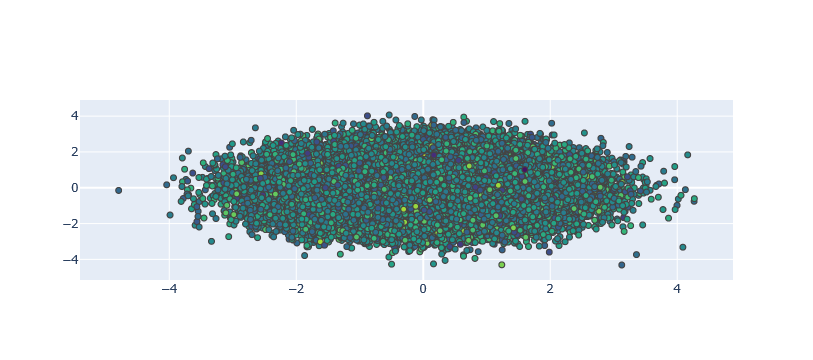

In [23]:
df_iris = px.data.iris()

px.scatter(df_iris, x="sepal_width", y="sepal_length", color="species", size="petal_length", 
           hover_data=["petal_width"])

fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x=df_iris.sepal_width, 
        y=df_iris.sepal_length, 
        mode="markers", 
        marker_color=df_iris.sepal_width, 
        text=df_iris.species, 
        marker=dict(showscale=True)
))
fig.update_traces(marker_line_width=2, marker_size=10)

fig = go.Figure(data=go.Scattergl(
    x=np.random.randn(100000),
    y=np.random.randn(100000),
    mode="markers",
    marker=dict(
        color=np.random.randn(100000),
        colorscale="viridis",
        line_width=1
    )
))
fig

# Pie Charts

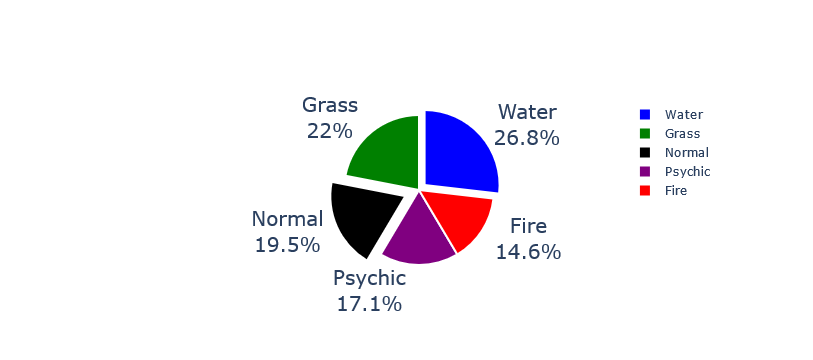

In [27]:
df_asia = px.data.gapminder().query("year == 2007").query("continent == 'Asia'")
px.pie(df_asia, values="pop", names="country", title="Population of Asian Continent", 
       color_discrete_sequence=px.colors.sequential.RdBu)

colors = ["blue", "green", "black", "purple", "red", "brown"]

fig = go.Figure(
    data=[go.Pie(
        labels=["Water", "Grass", "Normal", "Psychic", "Fire", "Ground"],
        values=[110, 90, 80, 70, 60]
    )]
)

fig.update_traces(
    hoverinfo="label+percent", 
    textfont_size=20, 
    textinfo="label+percent",
    pull=[0.1, 0, 0.2, 0, 0, 0],
    marker=dict(
        colors=colors, 
        line=dict(
            color="#FFFFFF", width=2
        )
    )
)

# Histograms

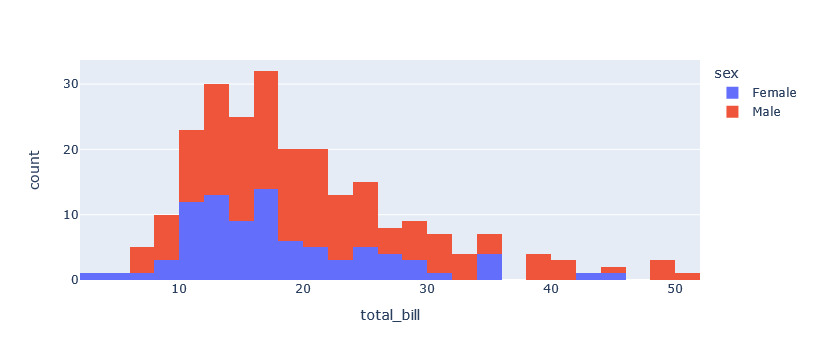

In [32]:
dice_1 = np.random.randint(1, 7, 10000)
dice_2 = np.random.randint(1, 7, 10000)

dice_sum = dice_1 + dice_2

fig = px.histogram(dice_sum, nbins=11, labels={"value": "Dice Roll"}, title="5000 Dice Roll Histogram",
                  marginal="violin", color_discrete_sequence=["green"])

fig.update_layout(
    xaxis_title_text="Dice Roll",
    yaxis_title_text="Dice Sum",
    bargap=0.2,
    showlegend=False
)

df_tips = px.data.tips()
px.histogram(df_tips, x="total_bill", color="sex")